In [1]:
import os
import sys
from pathlib import Path

import anndata as ad
import cv2 as cv
import h5py
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
from joblib import Parallel, delayed
from matplotlib.pyplot import rc_context
from skimage import exposure, io
from skimage.util import img_as_ubyte
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from tqdm.notebook import tqdm, trange

sc.settings.verbosity = 3

In [2]:
p_dir = (Path().cwd().parents[0]).absolute()
data_dir = p_dir / "data"

In [3]:
%load_ext autoreload
%autoreload 2

module_path = str(p_dir / "src")

if module_path not in sys.path:
    sys.path.append(module_path)

import scanorama
import utils as my_utils

In [4]:
experiment = "tonsil"
cores = ["DonorA", "DonorE"]
datasets = [core + f"_{i}" for core in cores for i in range(1, 7)]

# Load data

In [5]:
def read_props(dataset):
    df_morph = pd.read_csv(data_dir / "props" / f"morphology_IMC_{dataset}.csv")
    df_intensity_IMC = pd.read_csv(data_dir / "props" / f"intensity_IMC_{dataset}.csv")
    df_intensity_TS = pd.read_csv(data_dir / "props" / f"intensity_TS_{dataset}.csv")

    return df_morph, df_intensity_IMC, df_intensity_TS

In [6]:
adatas = []
for dataset in datasets:
    try:
        df_morph, df_intensity_IMC, df_intensity_TS = read_props(
            "_".join([experiment, dataset])
        )
    except:
        continue
    df_intensity_TS.drop(['Rest', 'Total'], axis=1, inplace=True)
    # df_intensity_TS.iloc[:, 1:] = df_intensity_TS.iloc[:, 1:].multiply(
    #     df_morph["area"], axis=0
    # )
    pseudo_count=1
    data_all = df_intensity_TS.iloc[:, 1:].values
    data_all_norm = (data_all+pseudo_count)/(np.percentile(data_all,50,axis=1,keepdims=True)+pseudo_count)
    data_all_norm = MinMaxScaler().fit_transform(data_all_norm)
    df_intensity_TS.iloc[:, 1:] = data_all_norm
    
    df = df_intensity_IMC.merge(df_intensity_TS, on="Id")
    df.set_index("Id", inplace=True)

    adata = sc.AnnData(df.values, dtype=df.values.dtype)
    adata.var_names = df.columns.tolist()
    adata.obs["Cell"] = df.index.tolist()
    adata.obs["Dataset"] = dataset.split("_")[0]
    adata.obs["Core"] = dataset
    adata.obsm["spatial"] = df_morph[["centroid-0", "centroid-1"]].to_numpy()
    adatas.append(adata)

adata = ad.concat(adatas, join="inner")

C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [12]:
IMC_markers = df_intensity_IMC.columns[1:]
SIMS_masses = df_intensity_TS.columns[1:]

In [13]:
IMC_markers

Index(['BCL6', 'C-Myc', 'CD11b', 'CD11c', 'CD138', 'CD20', 'CD21', 'CD27',
       'CD3', 'CD38', 'CD4', 'CD8', 'CD83', 'CD86', 'COL1', 'CXCR4', 'CXCR5',
       'DNA1', 'DNA2', 'EZH2', 'FoxP3', 'H3K27me3', 'ICOS1', 'Ki67', 'PD1',
       'Vimentin'],
      dtype='object')

In [14]:
IMC_markers = IMC_markers.drop(['BCL6', 'C-Myc', 'CD11b', 'CD11c', "FoxP3", "CD86", "CD83", "CXCR4", "DNA1", "DNA2", "CD11b", "CD11c"])

In [15]:
df_intensity_IMC

,Id,BCL6,C-Myc,CD11b,CD11c,CD138,CD20,CD21,CD27,CD3,...,CXCR5,DNA1,DNA2,EZH2,FoxP3,H3K27me3,ICOS1,Ki67,PD1,Vimentin
0,1,0.0,18.270833,0.0,7.229167,0.0,54.791667,0.937500,20.479167,70.666667,...,0.00000,47.895833,56.041667,0.000000,0.0,27.291667,0.0,0.0,0.000000,84.229167
1,2,0.0,45.000000,0.0,15.242424,0.0,33.818182,9.818182,39.787879,57.515152,...,0.00000,15.393939,15.454545,0.000000,0.0,22.575758,0.0,0.0,0.000000,109.272727
2,3,0.0,59.965517,0.0,38.448276,0.0,19.896552,14.448276,29.413793,88.068966,...,0.00000,52.655172,55.517241,0.000000,0.0,39.034483,0.0,0.0,0.000000,145.379310
3,4,0.0,37.207317,0.0,15.963415,0.0,23.695122,0.219512,60.073171,91.109756,...,0.00000,64.048780,60.304878,0.000000,0.0,30.682927,0.0,0.0,0.000000,74.951220
4,5,0.0,48.223404,0.0,27.095745,0.0,27.138298,6.212766,5.904255,87.372340,...,1.06383,33.063830,36.872340,0.000000,0.0,28.382979,0.0,0.0,0.000000,97.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3001,3002,0.0,36.857143,0.0,47.000000,0.0,60.380952,27.190476,0.000000,0.000000,...,0.00000,96.761905,70.952381,55.142857,0.0,19.428571,0.0,0.0,0.000000,0.190476
3002,3003,0.0,51.166667,0.0,23.583333,0.0,56.041667,19.958333,8.625000,0.000000,...,0.00000,47.125000,47.458333,72.041667,0.0,16.750000,0.0,0.0,0.000000,28.541667
3003,3004,0.0,20.416667,0.0,2.694444,0.0,17.527778,12.861111,2.138889,0.000000,...,0.00000,20.277778,20.416667,0.000000,0.0,6.750000,0.0,0.0,0.000000,0.000000
3004,3005,0.0,20.589286,0.0,22.464286,0.0,28.142857,8.410714,10.017857,23.232143,...,0.00000,37.357143,34.107143,0.000000,0.0,12.071429,0.0,0.0,10.017857,2.553571


# IMC cell phenotype

## Data ingegration

In [16]:
adata_IMC = adata[:, IMC_markers]

In [17]:
alldata = {}

for batch in adata_IMC.obs["Core"].unique():
    adata_subset = adata_IMC[
        adata_IMC.obs["Core"] == batch,
    ]
    sc.pp.scale(adata_subset, max_value=4)
    alldata[batch] = adata_subset

# convert to list of AnnData objects
adatas = list(alldata.values())

# run scanorama.integrate
adatas_cor = scanorama.correct_scanpy(adatas, return_dimred=True, return_dense=True, dimred=10)

# make into one matrix.
adata_IMC = ad.concat(adatas_cor)

C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\scanpy\preprocessing\_simple.py:843: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  view_to_actual(adata)
C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\scanpy\preprocessing\_simple.py:843: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pa

Found 16 genes among all datasets
[[0.         0.35641615 0.72045562 0.50940612 0.81299213 0.45628919
  0.39952397 0.31611951 0.4732571  0.32175032 0.21763187]
 [0.         0.         0.31086853 0.83491959 0.21692913 0.38660978
  0.3182591  0.31375123 0.27502461 0.29257829 0.22415491]
 [0.         0.         0.         0.37873754 0.82440945 0.22211675
  0.4660655  0.31371618 0.38395823 0.18984338 0.20835311]
 [0.         0.         0.         0.         0.4503937  0.58058925
  0.37266236 0.30641248 0.36707106 0.48090948 0.21906412]
 [0.         0.         0.         0.         0.         0.48937008
  0.3750425  0.21417323 0.37125984 0.24624625 0.1523622 ]
 [0.         0.         0.         0.         0.         0.
  0.3182591  0.66892091 0.72566892 0.71042471 0.53984122]
 [0.         0.         0.         0.         0.         0.
  0.         0.78442707 0.75110507 0.38252295 0.69568174]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.8287784  0.536

C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\scanorama\scanorama.py:237: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = AnnData(datasets[i])
C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\scanorama\scanorama.py:237: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = AnnData(datasets[i])
C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\scanorama\scanorama.py:237: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pa

In [18]:
sc.pp.neighbors(adata_IMC, use_rep="X_scanorama")
sc.tl.umap(adata_IMC)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:17)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:17)


C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


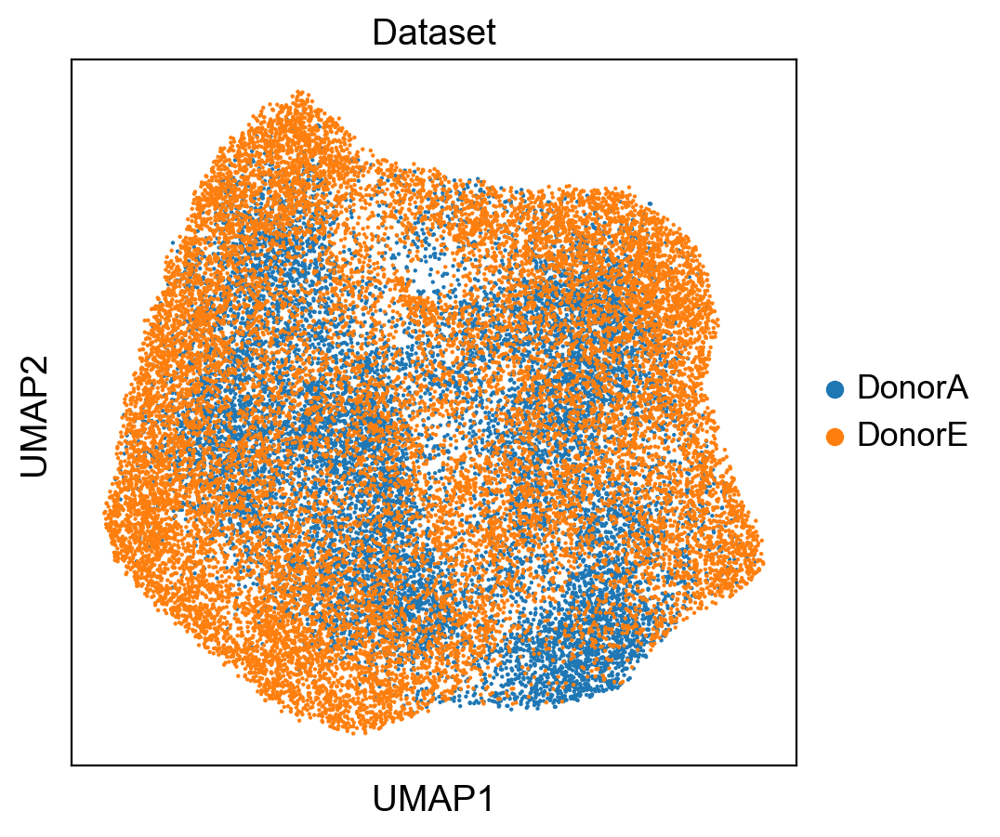

In [19]:
sc.set_figure_params(format="png")

with rc_context({"figure.figsize": (5, 5), "figure.dpi": 100}):
    fig = sc.pl.umap(adata_IMC, color=["Dataset"], size=10)

C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


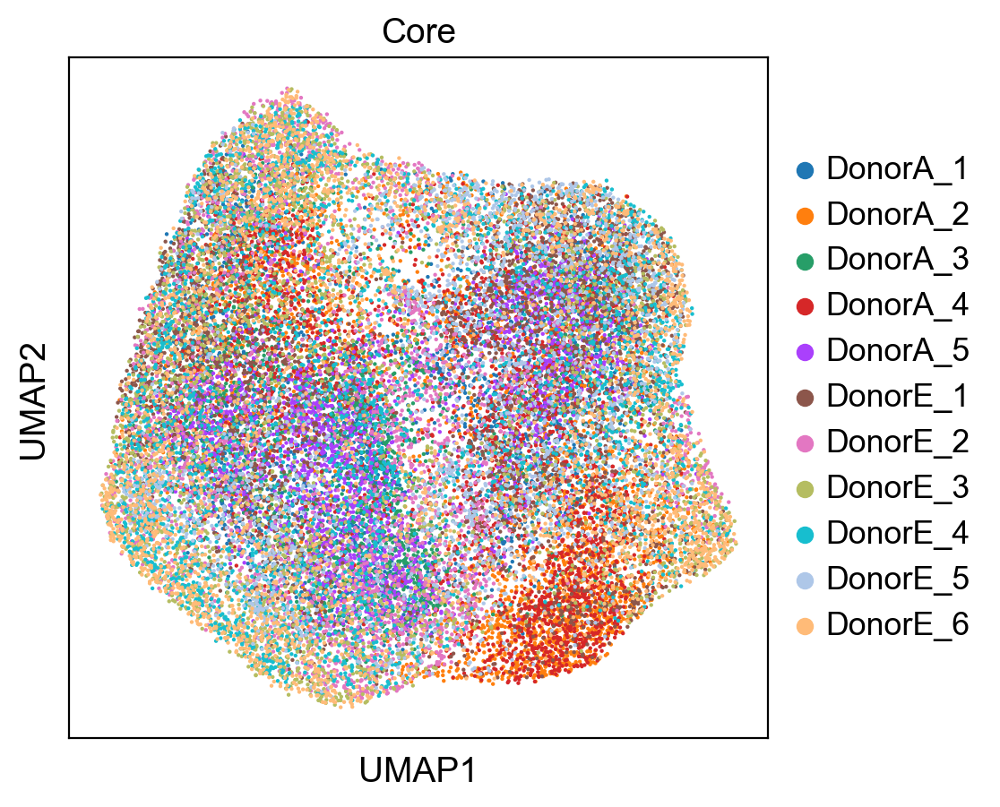

In [20]:
sc.set_figure_params(format="png")

with rc_context({"figure.figsize": (5, 5), "figure.dpi": 100}):
    fig = sc.pl.umap(adata_IMC, color=["Core"], size=10)

In [21]:
# sc.tl.tsne(adata_IMC, use_rep="X_scanorama")

In [22]:
# sc.set_figure_params(format="png")

# with rc_context({"figure.figsize": (7, 7), "figure.dpi": 100}):
#     fig = sc.pl.tsne(adata_IMC, color=["Dataset"], size=10)

## Clustering

In [23]:
import palettable
heatmap_cmp = palettable.cmocean.diverging.Balance_20.mpl_colormap


In [24]:
sc.pp.neighbors(adata_IMC, metric='cosine', use_rep="X_scanorama", random_state=0)
sc.tl.leiden(adata_IMC, resolution=0.7, random_state=0)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:06)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:07)


C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


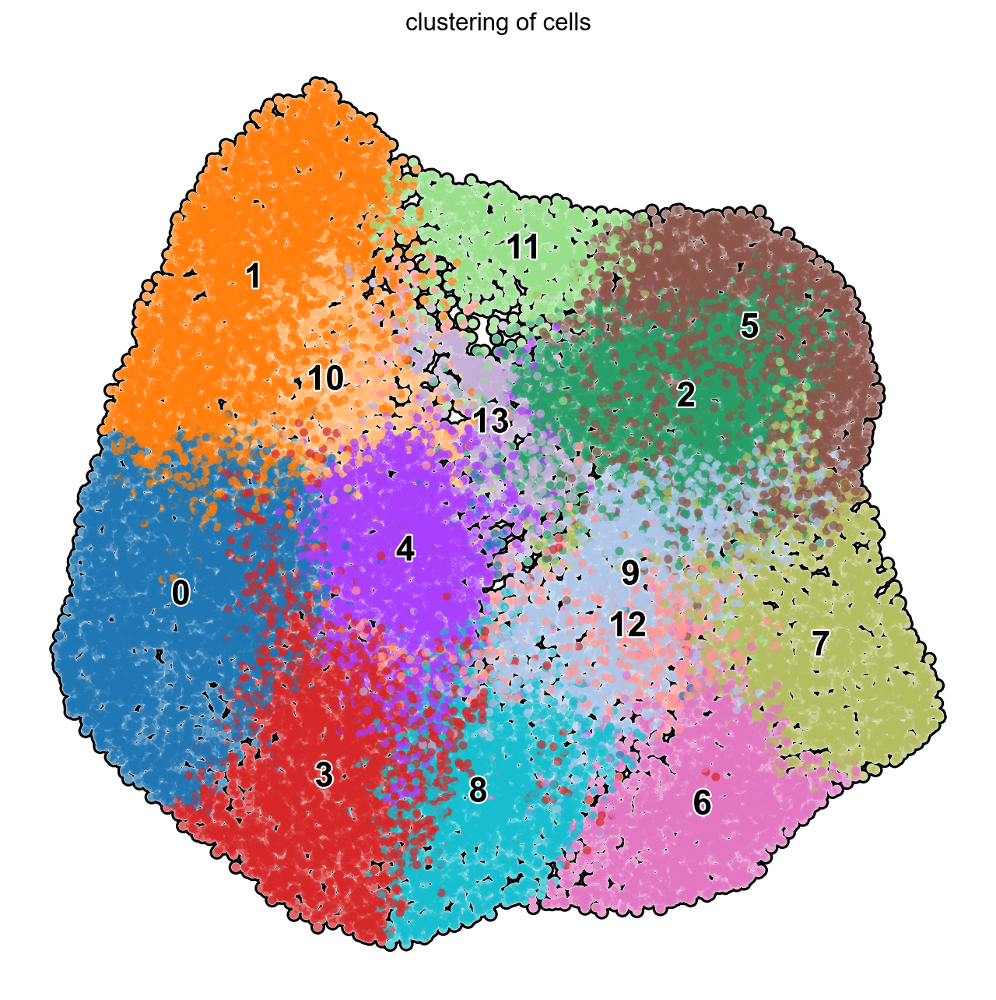

In [25]:
with rc_context({"figure.figsize": (10, 10)}):
    sc.pl.umap(
        adata_IMC,
        color=["leiden"],
        size=100,
        legend_loc="on data",
        add_outline=True,
        legend_fontsize=20,
        legend_fontoutline=2,
        frameon=False,
        title="clustering of cells",
    )

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_leiden']`


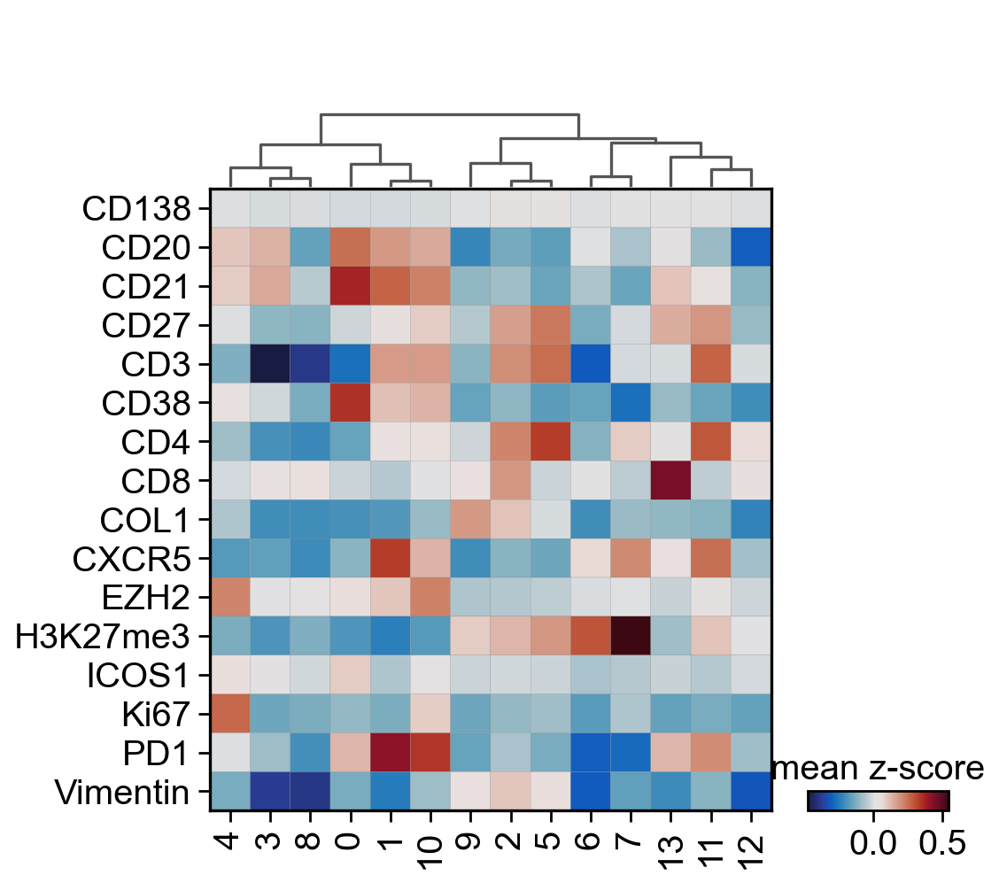

In [26]:
sc.tl.dendrogram(adata_IMC, groupby="leiden")
sns.set_style(rc = {'axes.facecolor':  (1,1,1,0),  'figure.facecolor':  (1,1,1,0)})
sns.set_context("notebook", font_scale=1.8)
sc.pl.matrixplot(
    adata_IMC,
    adata_IMC.var_names.tolist(),
    "leiden",
    dendrogram=True,
    colorbar_title="mean z-score",
    cmap=heatmap_cmp,
    swap_axes=True,
    # vmin=-0.25,
    # vmax=0.5
)

C:\Users\thu71\Anaconda3\envs\scspamet\lib\site-packages\scanpy\plotting\_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


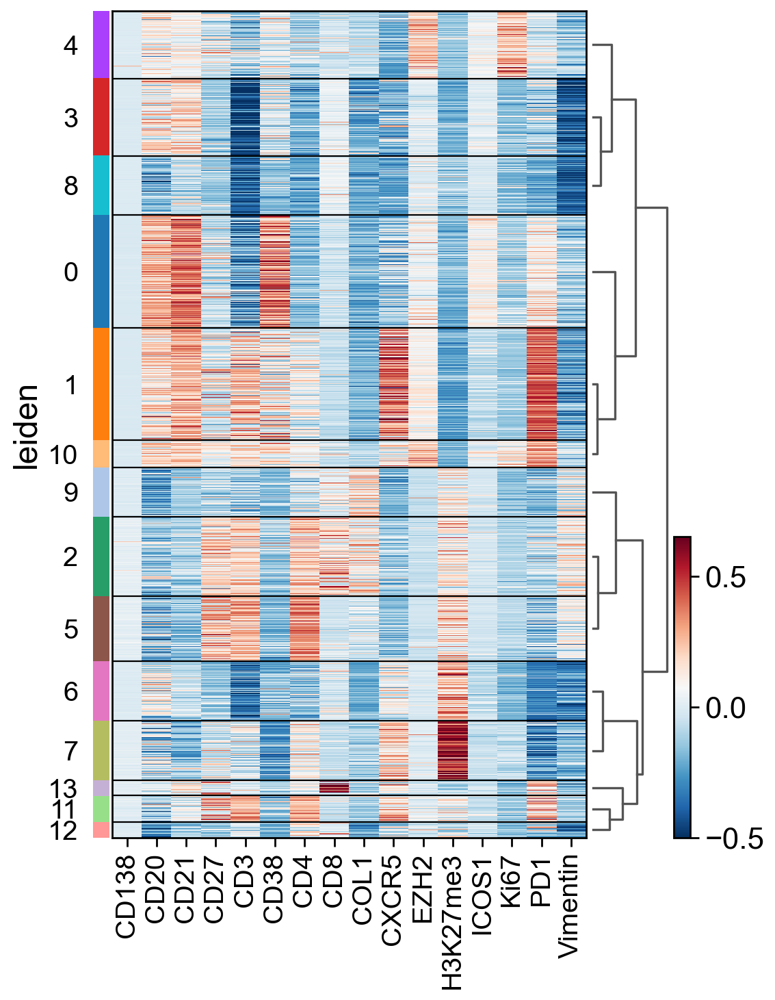

In [27]:
sc.pl.heatmap(
    adata_IMC,
    adata_IMC.var_names.tolist(),
    "leiden",
    dendrogram=True,
    cmap="RdBu_r",
    figsize=(7, 10),
    vmin=-0.5,
    vmax=0.65
)

In [28]:
cluster_label_order = adata_IMC.uns['dendrogram_leiden']['categories_ordered']

In [29]:
import matplotlib 

colors = adata_IMC.uns["leiden_colors"]
labels = adata_IMC.obs.leiden.cat.categories.tolist()

colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

colors_rgb_dict = {k:v for k,v in zip(labels, colors_rgb)}

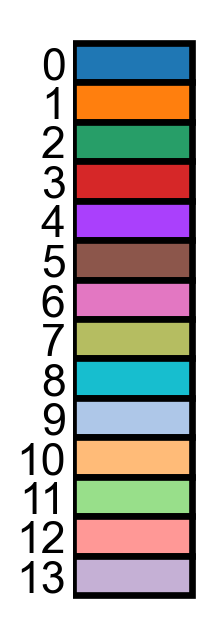

In [30]:
# legend
fig, ax = plt.subplots(figsize=(1,5))
ax.barh(y=range(len(colors_rgb_dict.values())), 
        color=np.array(list(colors_rgb_dict.values()))/255,
        width=1, 
        height=1,
        edgecolor='k',
        linewidth=3,
       )
_ = plt.yticks(range(len(colors_rgb_dict.values())), colors_rgb_dict.keys(), rotation=0, size=20)
_ = plt.xticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.tick_params(axis=u'both', which=u'both',length=0)
# ax.yaxis.tick_right()
ax.invert_yaxis()
ax.grid(False)


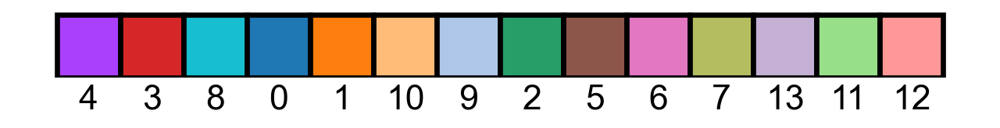

In [31]:
# legend
c=np.array([colors_rgb_dict[i] for i in cluster_label_order])

fig, ax = plt.subplots(figsize=(10,0.7))
ax.bar(x=cluster_label_order, 
        color=c/255,
        width=1, 
        height=1,
        edgecolor='k',
        linewidth=3,
       )
_ = plt.xticks(range(len(colors_rgb_dict.values())), cluster_label_order, rotation=0, size=20)
_ = plt.yticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.tick_params(axis=u'both', which=u'both',length=0)
ax.grid(False)


In [32]:
df = pd.DataFrame(adata_IMC.X, columns=adata_IMC.var_names)
df['ROI'] = adata_IMC.obs.Dataset.tolist()
df['Clusters'] = adata_IMC.obs.leiden.tolist()

In [33]:
df_count = (
    df.groupby(['ROI', 'Clusters'])
    .size()
    .div(
        df.groupby(['ROI'])['Clusters'].size()
    )
    .reset_index(name = 'Density')
)

<AxesSubplot: xlabel='Clusters', ylabel='Density'>

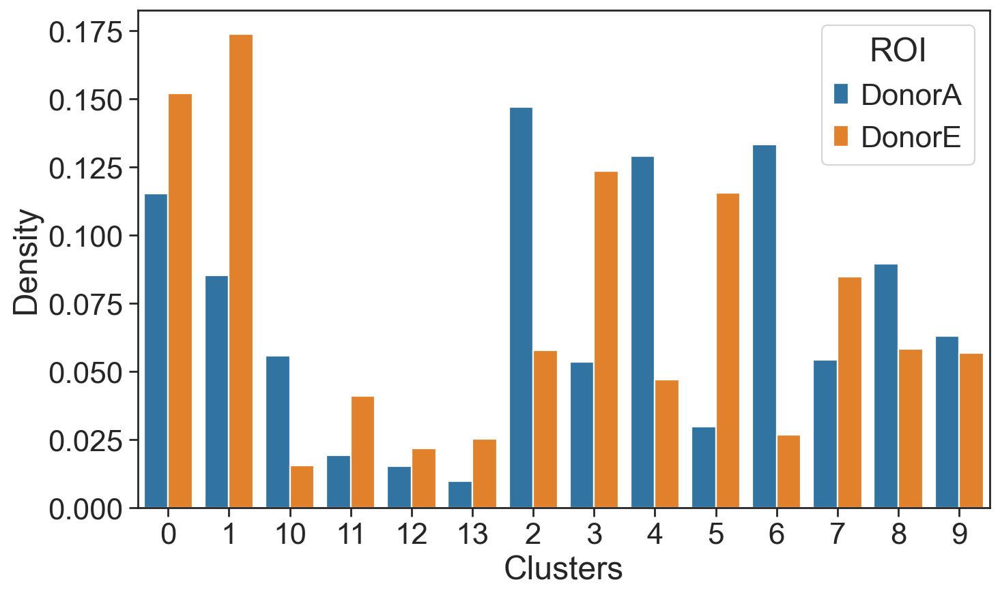

In [34]:
sns.set_style('ticks')
fig, ax = plt.subplots(figsize=(10,6))
sns.barplot(data=df_count, x='Clusters', y='Density', hue='ROI', ax=ax)

## Spatial projection

In [192]:
from typing import List
import matplotlib
import skimage
from skimage import measure


def get_masks(mask_folder, dataset):
    """
    Function to get all mask from mask forlder
    """
    # Read masks
    masks = {}

    for (dirpath, dirnames, filenames) in os.walk(mask_folder):
        for name in sorted(filenames):
            if "tif" in name and dataset in name:
                filename = os.path.join(dirpath, name)
                img = skimage.io.imread(filename)
                condition = name.split(".")[0]
                masks[condition] = img
            else:
                continue
    return masks


def create_clustered_cell(mask, label2cell, my_cmap, **kwargs):
    img = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)

    for i, cells in tqdm(label2cell.items(), total=len(label2cell)):
        rows, cols = np.where(np.isin(mask, cells))
        img[rows, cols, :] = my_cmap[int(i)]

    return img


def get_contour(mask: np.ndarray) -> List[List[float]]:
    """
    Get contours of mask
    """
    contours = []
    for i in sorted(np.unique(mask)):
        if i == 0:
            continue
        contours.append(measure.find_contours(mask == i, 0.8)[0])

    return contours

In [193]:
masks = get_masks(data_dir / "masks", f"{experiment}")

In [194]:
colors = adata_IMC.uns["leiden_colors"]
labels = np.unique(adata_IMC.obs.leiden.tolist())

colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

DonorA_1


  0%|          | 0/12 [00:00<?, ?it/s]

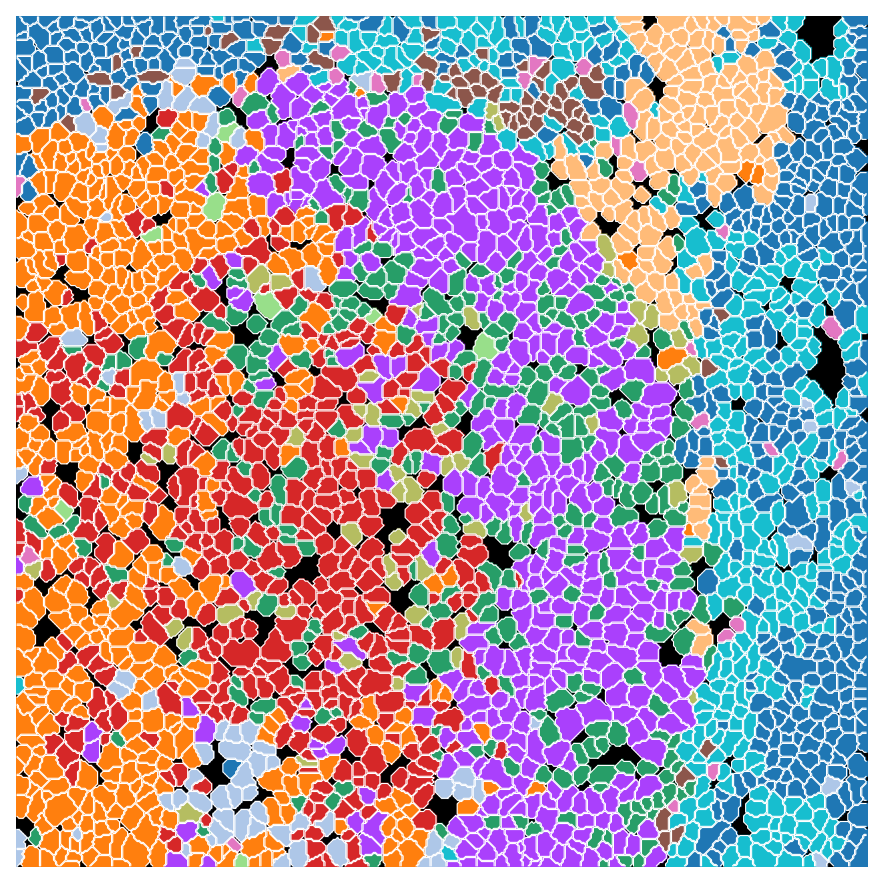

DonorA_2


  0%|          | 0/12 [00:00<?, ?it/s]

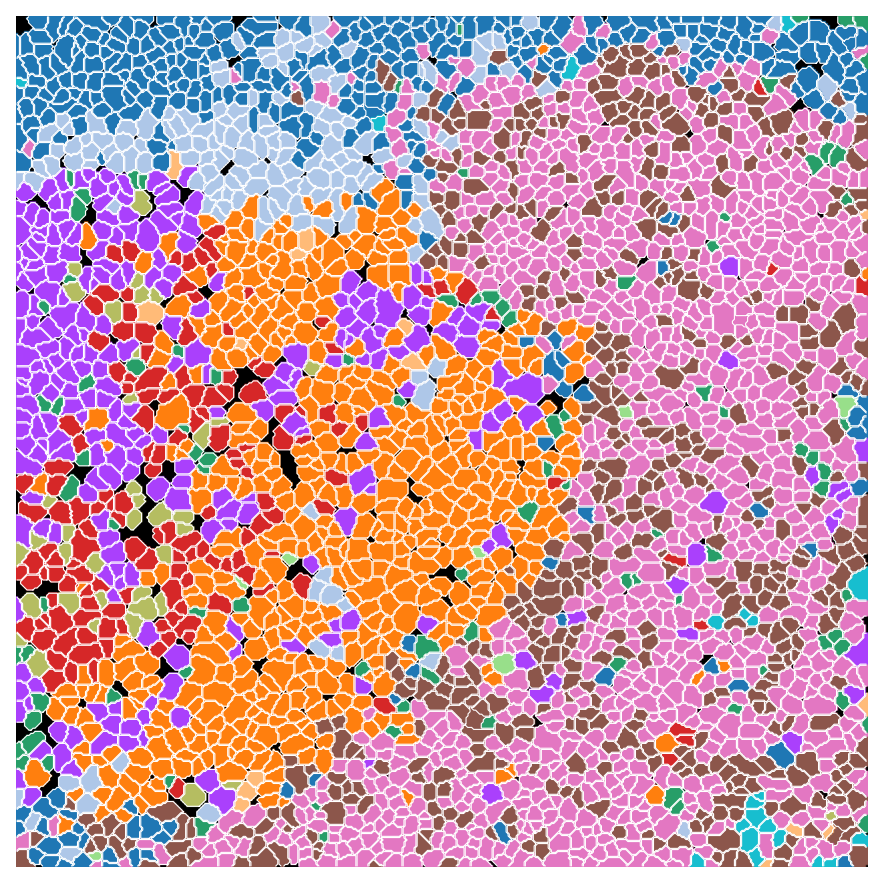

DonorA_3


  0%|          | 0/12 [00:00<?, ?it/s]

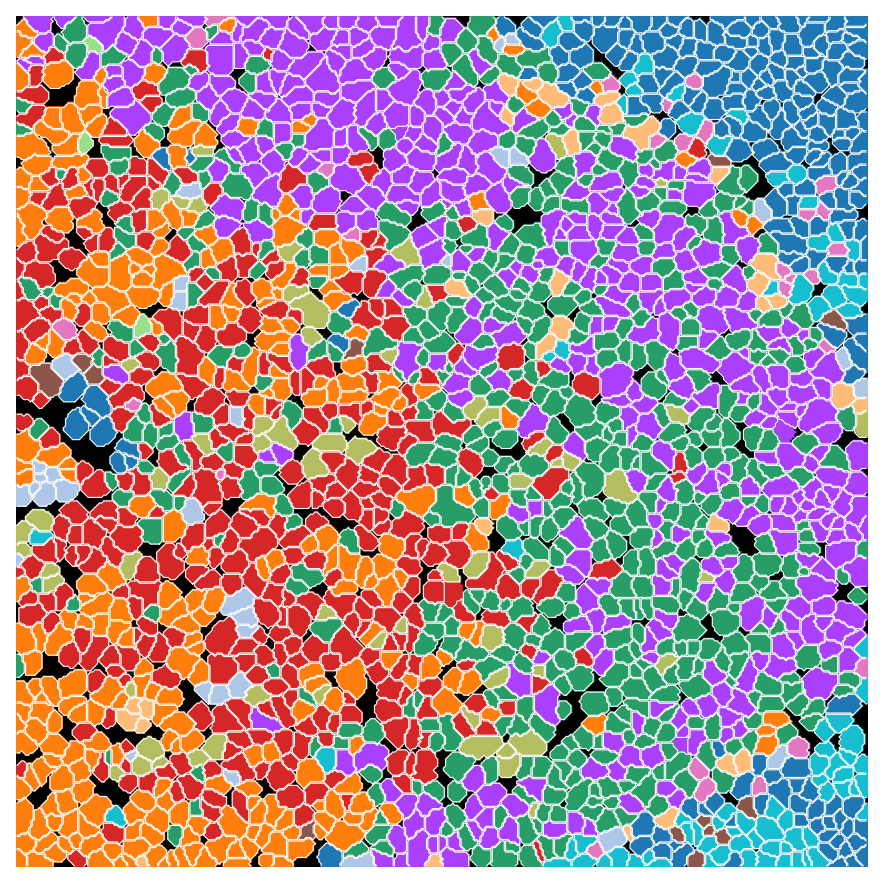

DonorA_4


  0%|          | 0/12 [00:00<?, ?it/s]

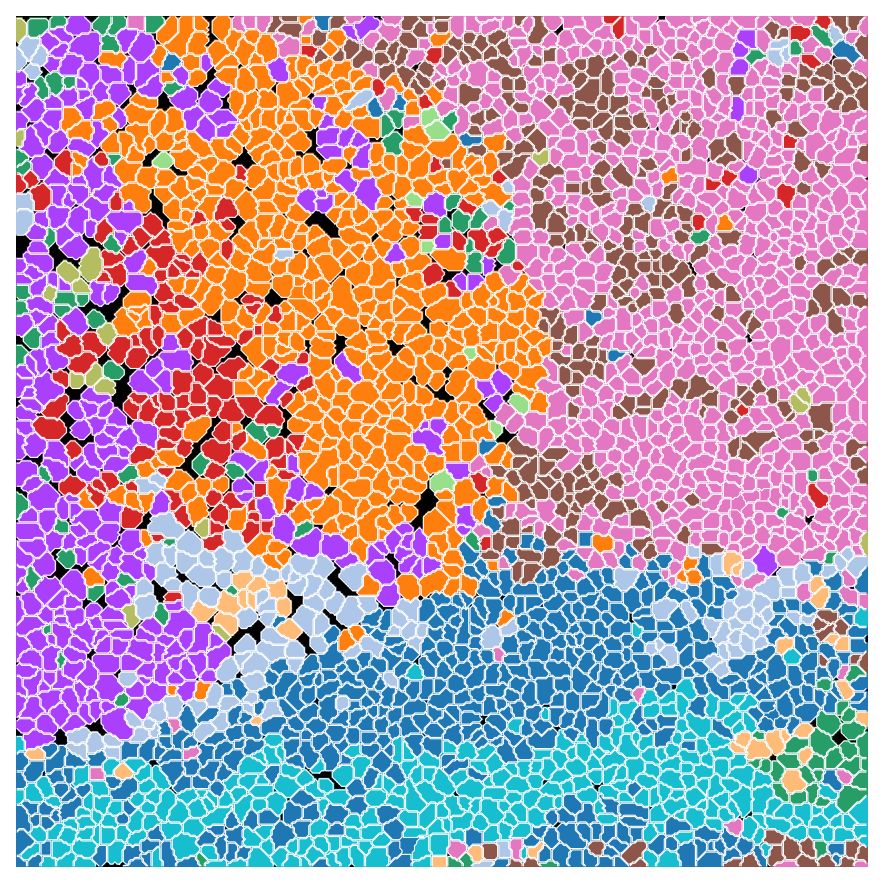

DonorA_5


  0%|          | 0/12 [00:00<?, ?it/s]

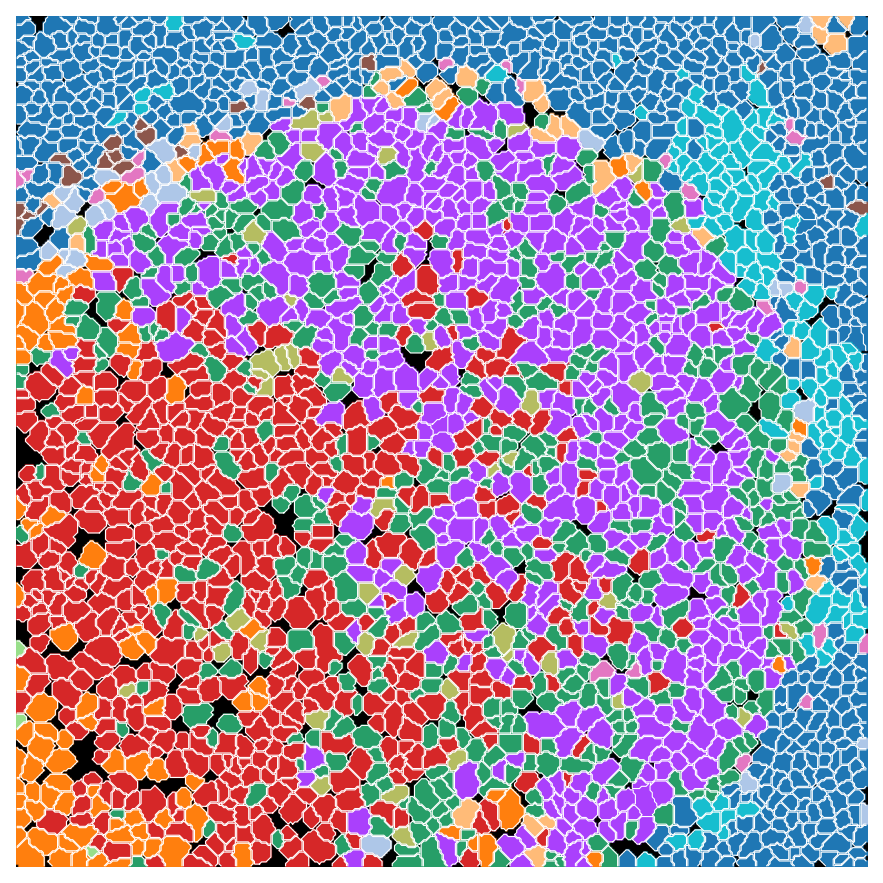

DonorA_6
DonorE_1


  0%|          | 0/12 [00:00<?, ?it/s]

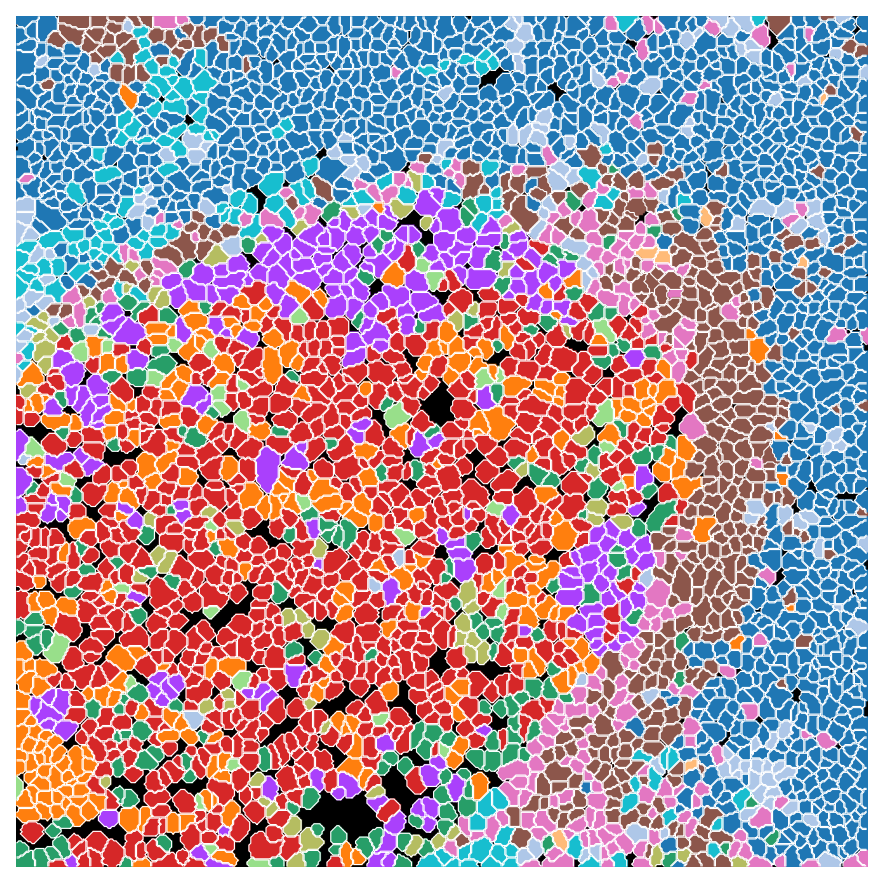

DonorE_2


  0%|          | 0/12 [00:00<?, ?it/s]

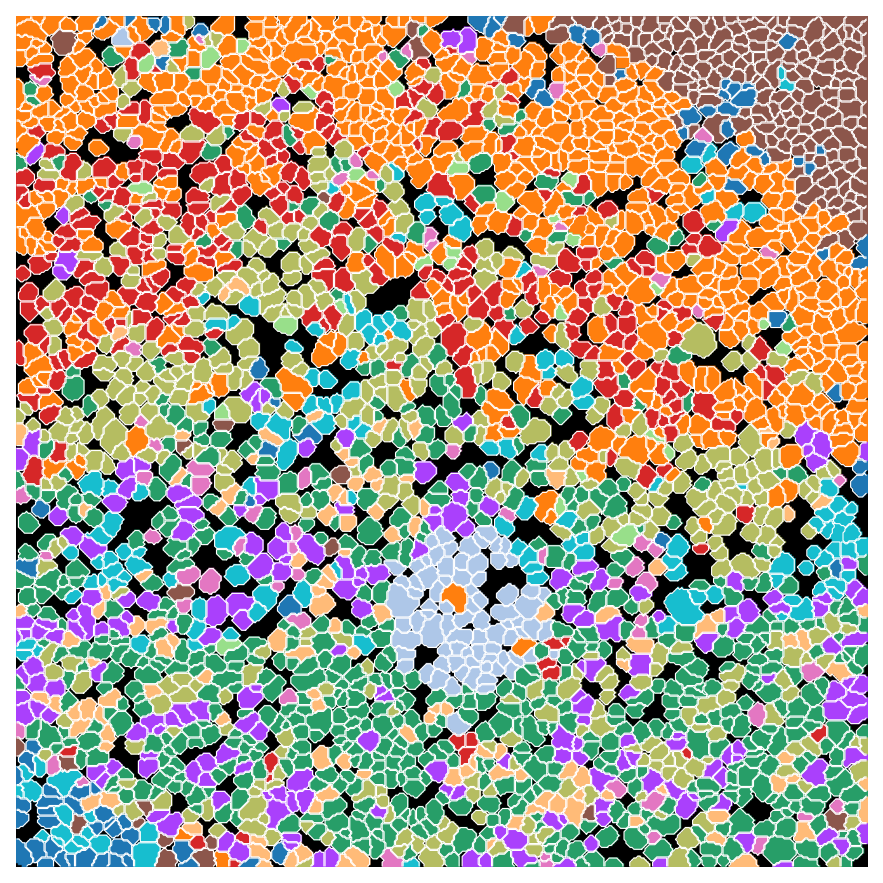

DonorE_3


  0%|          | 0/12 [00:00<?, ?it/s]

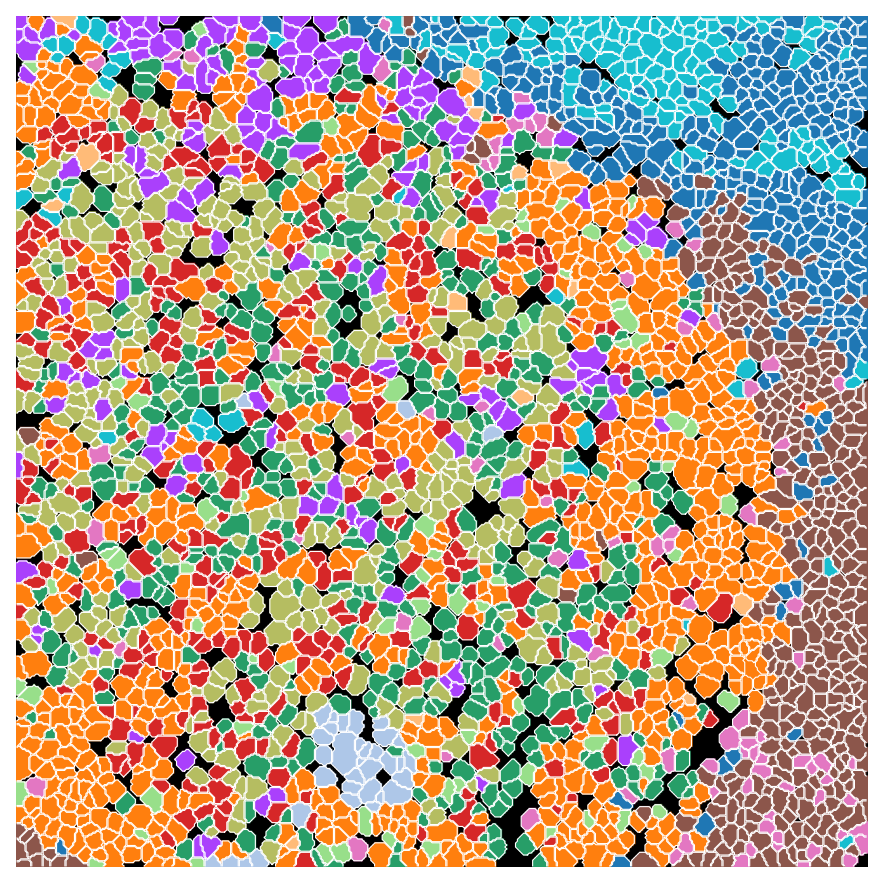

DonorE_4


  0%|          | 0/12 [00:00<?, ?it/s]

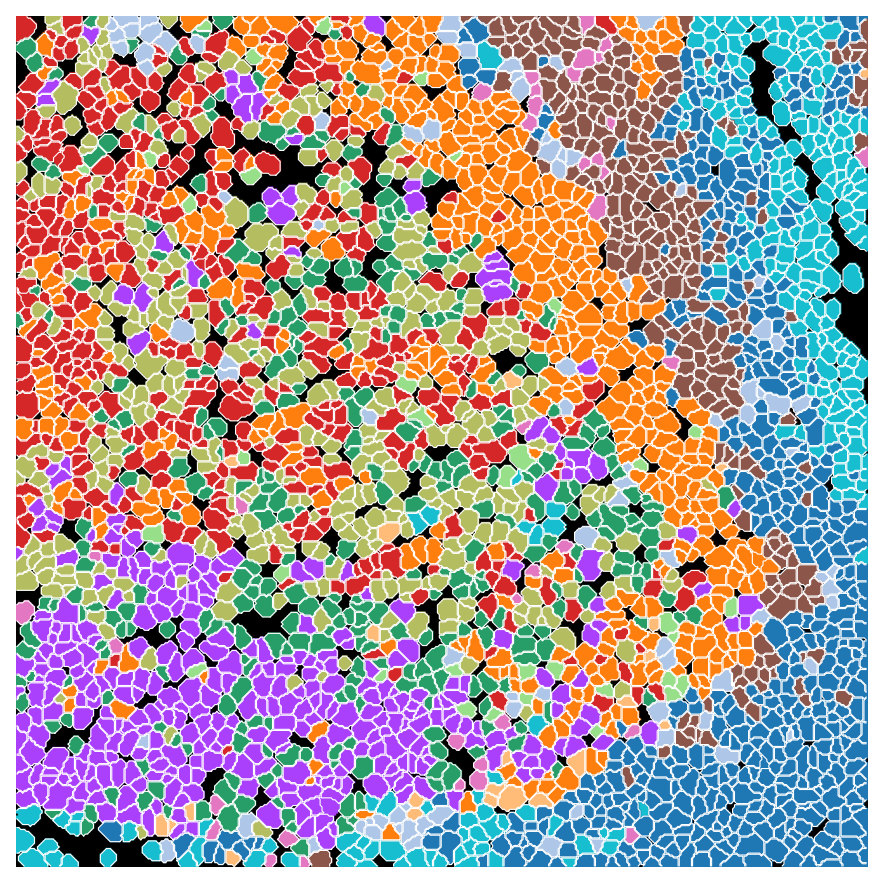

DonorE_5


  0%|          | 0/12 [00:00<?, ?it/s]

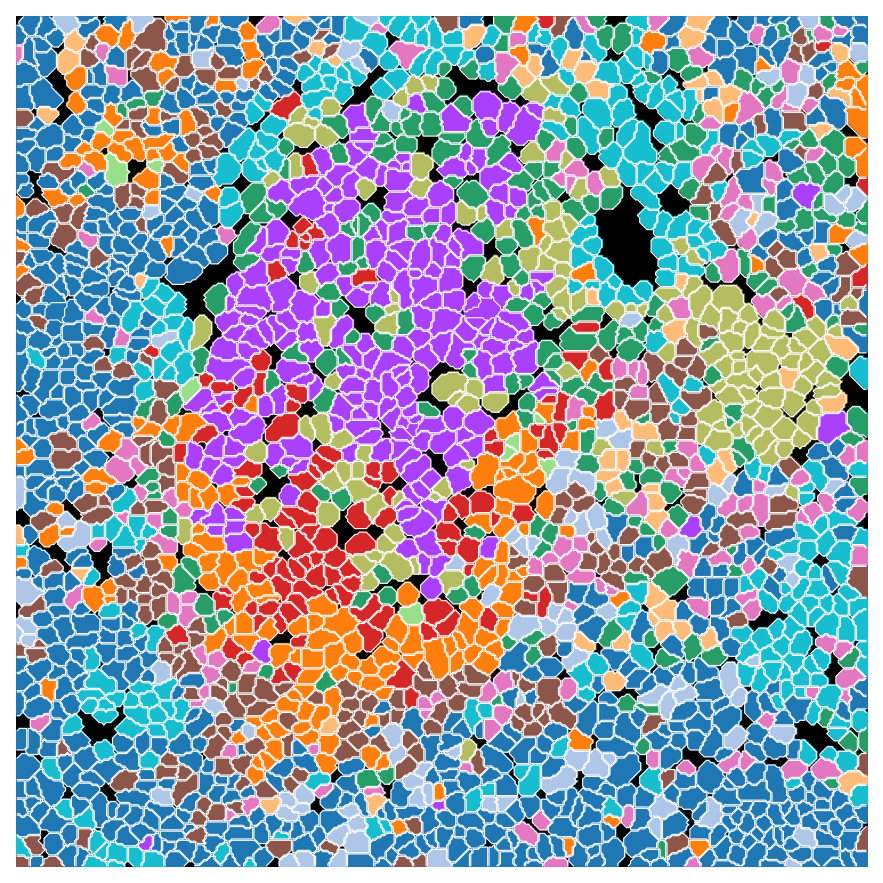

DonorE_6


  0%|          | 0/12 [00:00<?, ?it/s]

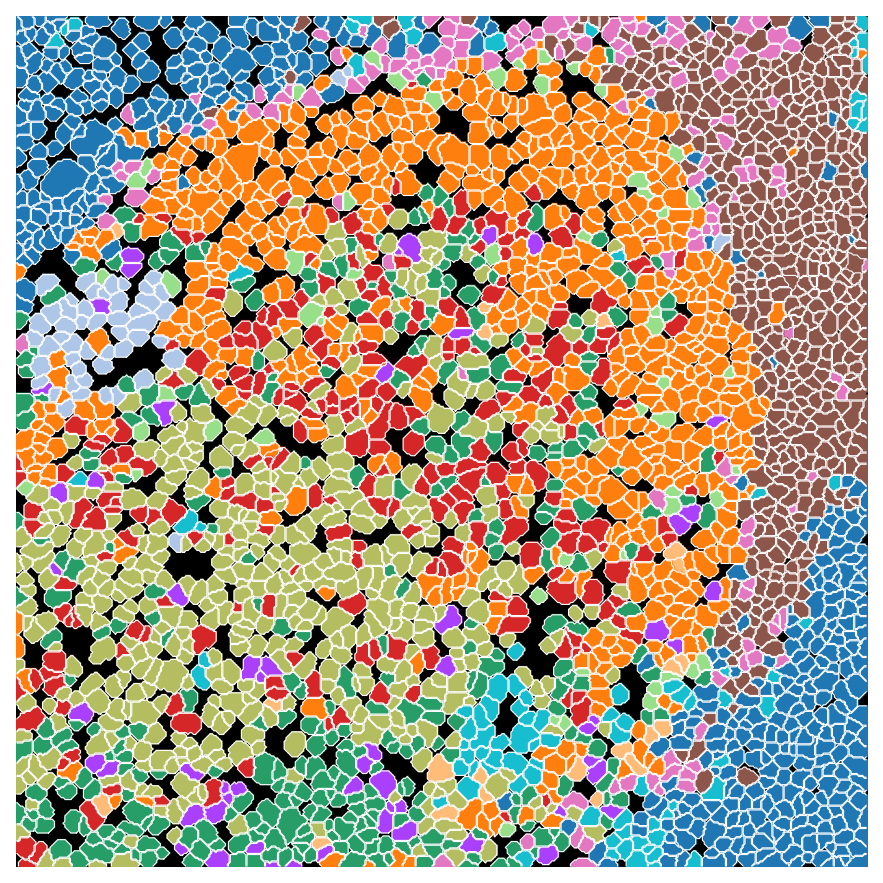

In [195]:
for dataset in datasets:
    print(dataset)
    adata_subset = adata_IMC[adata_IMC.obs.Core == dataset, :]
    try:
        mask = masks["_".join([experiment, dataset])]
        contours = get_contour(mask)
    except:
        continue

    # Get label2cell dict
    label2cell = {}
    for l in labels:
        cell_id = adata_subset[adata_subset.obs.leiden == l].obs.Cell.to_list()
        label2cell[l] = cell_id

    img = create_clustered_cell(mask, label2cell, colors_rgb)

    fig, ax = plt.subplots(figsize=(7, 7))
    ax.imshow(img)
    for j, contour in enumerate(contours):
        ax.plot(contour[:, 1], contour[:, 0], linewidth=0.5, color="white")
    ax.axis("off")
    plt.show()

In [196]:
path = data_dir / "adata" / f"{experiment}.h5ad"
adata_IMC.write(path)


## Get Lipids and AC list from 3D-SMF

In [135]:
ac_mass = [44, 70, 73, 56, 84, 42, 82, 86, 61, 74, 72]
ac_index = [SIMS_masses.index(str(i)) for i in ac_mass]
ac_names = [
    "Alanine",
    "Arginine",
    "Asparagine",
    "Glutamine",
    "Glutamine acid",
    "Glycine",
    "Histidine",
    "Leucine/Isoleucine",
    "Methionine",
    "Threonine",
    "Valine",
]

AttributeError: 'Index' object has no attribute 'index'

In [ ]:
df_lipid = pd.read_csv(data_dir / "metadata" / "lipid.csv")
df_lipid = df_lipid[["Mass", "Name"]]

lipid_mass = df_lipid.Mass.values.tolist()
lipid_names = df_lipid.Name.values.tolist()
lipid_index = [SIMS_masses.index(str(i)) for i in lipid_mass]

## Check variation of lipids and AC from IMC clustering

In [ ]:
adata_SIMS = adata[:, SIMS_masses]
sc.pp.log1p(adata_SIMS)
# sc.pp.scale(adata_SIMS, max_value=4)

In [ ]:
adata_SIMS.obs["leiden"] = adata_IMC.obs["leiden"]
adata_SIMS.uns["leiden_colors"] = adata_IMC.uns["leiden_colors"]

In [ ]:
sc.tl.rank_genes_groups(adata_SIMS, groupby="Dataset", method="wilcoxon")
sc.pl.rank_genes_groups_dotplot(adata_SIMS, n_genes=20, cmap="bwr")
sc.pl.rank_genes_groups_matrixplot(adata_SIMS, n_genes=20, cmap="bwr")

In [ ]:
adata_subset = adata_SIMS[:, lipid_index]

sc.pl.matrixplot(
    adata_subset,
    adata_subset.var_names.tolist(),
    "Core",
    swap_axes=True,
    dendrogram=True,
    cmap="RdBu_r",
    figsize=(7, 10),
)
sc.tl.rank_genes_groups(adata_subset, groupby="Core", method="wilcoxon")
sc.pl.rank_genes_groups_dotplot(adata_subset, n_genes=5, cmap="bwr")
sc.pl.rank_genes_groups_matrixplot(adata_subset, n_genes=5, cmap="bwr")

In [ ]:
sc.pl.heatmap(
    adata_subset,
    adata_subset.var_names.tolist(),
    "Core",
    swap_axes=False,
    dendrogram=False,
    cmap="RdBu_r",
    figsize=(15, 15),
    vmax=4,
    show_gene_labels=True,
)

In [ ]:
adata_subset = adata_SIMS[:, lipid_index]

sc.pl.matrixplot(
    adata_subset,
    adata_subset.var_names.tolist(),
    "leiden",
    swap_axes=True,
    dendrogram=True,
    cmap="RdBu_r",
    figsize=(7, 10),
)
sc.tl.rank_genes_groups(adata_subset, groupby="leiden", method="wilcoxon")
sc.pl.rank_genes_groups_dotplot(adata_subset, n_genes=5, cmap="bwr")
sc.pl.rank_genes_groups_matrixplot(adata_subset, n_genes=5, cmap="bwr")

In [ ]:
sc.pl.heatmap(
    adata_subset,
    adata_subset.var_names.tolist(),
    "leiden",
    swap_axes=False,
    dendrogram=False,
    cmap="RdBu_r",
    figsize=(15, 15),
    show_gene_labels=True,
)

In [ ]:
sc.pl.heatmap(
    adata_IMC,
    adata_IMC.var_names.tolist(),
    "leiden",
    dendrogram=False,
    cmap="RdBu_r",
    figsize=(7, 15),
    vmin=-0.5,
    vmax=0.5,
)

In [ ]:
sc.pl.matrixplot(
    adata_subset,
    adata_subset.var_names.tolist(),
    "leiden",
    swap_axes=False,
    dendrogram=True,
    cmap="RdBu_r",
    figsize=(12, 5),
    # vmin=-0.5,
    # vmax=0.5,
)

In [ ]:
sc.pl.matrixplot(
    adata_IMC,
    adata_IMC.var_names.tolist(),
    "leiden",
    swap_axes=False,
    dendrogram=False,
    cmap="RdBu_r",
    figsize=(8, 5),
    vmin=-0.5,
    vmax=0.5,
)

## Lipids clustering

In [ ]:
adata_lipid = adata_SIMS[:, lipid_index]


In [ ]:
alldata = {}

for batch in adata_lipid.obs["Core"].unique():
    adata_subset = adata_lipid[
        adata_lipid.obs["Core"] == batch,
    ]
    sc.pp.scale(adata_subset, max_value=2.5)
    alldata[batch] = adata_subset

# convert to list of AnnData objects
adatas = list(alldata.values())

# run scanorama.integrate
adatas_cor = scanorama.correct_scanpy(adatas, return_dimred=True, return_dense=True)

# make into one matrix.
adata_lipid = ad.concat(adatas_cor)

In [ ]:
sc.pp.neighbors(adata_lipid, use_rep="X_scanorama", random_state=0)
sc.tl.leiden(adata_lipid, resolution=1, random_state=0)

In [ ]:
sc.tl.tsne(adata_lipid, use_rep="X_scanorama")

In [ ]:
# sc.pp.scale(adata_IMC, max_value=2.5)
sc.tl.dendrogram(adata_IMC, groupby="leiden")
sc.pl.matrixplot(
    adata_IMC,
    adata_IMC.var_names.tolist(),
    "leiden",
    dendrogram=True,
    colorbar_title="mean z-score",
    cmap="RdBu_r",
    vmin=-0.5,
    vmax=0.5,
)

In [ ]:
sc.pl.heatmap(
    adata_IMC,
    adata_IMC.var_names.tolist(),
    "leiden",
    dendrogram=True,
    cmap="RdBu_r",
    figsize=(7, 10),
    vmin=-0.5,
    vmax=0.5,
)

## Spatial projection

In [ ]:
from typing import List

import matplotlib
import skimage
from skimage import measure


def get_masks(mask_folder, dataset):
    """
    Function to get all mask from mask forlder
    """
    # Read masks
    masks = {}

    for (dirpath, dirnames, filenames) in os.walk(mask_folder):
        for name in sorted(filenames):
            if "tif" in name and dataset in name:
                filename = os.path.join(dirpath, name)
                img = skimage.io.imread(filename)
                condition = name.split(".")[0]
                masks[condition] = img
            else:
                continue
    return masks


def create_clustered_cell(mask, label2cell, my_cmap, **kwargs):
    img = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)

    for i, cells in tqdm(label2cell.items(), total=len(label2cell)):
        rows, cols = np.where(np.isin(mask, cells))
        img[rows, cols, :] = my_cmap[int(i)]

    return img


def get_contour(mask: np.ndarray) -> List[List[float]]:
    """
    Get contours of mask
    """
    contours = []
    for i in sorted(np.unique(mask)):
        if i == 0:
            continue
        contours.append(measure.find_contours(mask == i, 0.8)[0])

    return contours

In [ ]:
masks = get_masks(data_dir / "masks", f"{experiment}")

In [ ]:
colors = adata_IMC.uns["leiden_colors"]
labels = np.unique(adata_IMC.obs.leiden.tolist())

colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

In [ ]:
for dataset in datasets:
    print(dataset)
    adata_subset = adata_IMC[adata_IMC.obs.Core == dataset, :]
    try:
        mask = masks["_".join([experiment, dataset])]
        contours = get_contour(mask)
    except:
        continue

    # Get label2cell dict
    label2cell = {}
    for l in labels:
        cell_id = adata_subset[adata_subset.obs.leiden == l].obs.Cell.to_list()
        label2cell[l] = cell_id

    img = create_clustered_cell(mask, label2cell, colors_rgb)

    fig, ax = plt.subplots(figsize=(5, 5))
    ax.imshow(img)
    for j, contour in enumerate(contours):
        ax.plot(contour[:, 1], contour[:, 0], linewidth=1, color="white")
    ax.axis("off")
    plt.show()

In [ ]:
df = pd.DataFrame(adata_IMC.X, columns=adata_IMC.var_names)
df['ROI'] = adata_IMC.obs.Dataset.tolist()
df['Clusters'] = adata_IMC.obs.leiden.tolist()

In [ ]:
df_count = (
    df.groupby(['ROI', 'Clusters'])
    .size()
    .div(
        df.groupby(['ROI'])['Clusters'].size()
    )
    .reset_index(name = 'Density')
)

In [ ]:
sns.set_style('ticks')
fig, ax = plt.subplots(figsize=(10,6))
sns.barplot(data=df_count, x='Clusters', y='Density', hue='ROI', ax=ax)